In [1]:
from config import *

In [2]:
import shapely

# 1. Data loader

## 1) read metashape project and DOM/DSM outputs

In [3]:
ms_dict = {}
for key, val in process_date.items():
    ms = idp.Metashape(val['project'], val['chunk_id'])
    ms.dom = idp.GeoTiff(val['dom'])
    ms.dsm = idp.GeoTiff(val['dsm'])
    ms.crs = ms.dom.crs

    ms_dict[key] = ms

## 2) read broccoli head geo-position

In [4]:
# created by 01_prepare_data
pickle_file = "__pycache__/points_np2d.pkl"

with open(pickle_file, 'rb') as handle:
    head_np2d = pickle.load(handle)

head_np2d

array([[ 368059.70337271, 3956057.88353261],
       [ 368059.93162897, 3956056.75447929],
       [ 368060.07021313, 3956056.04525446],
       ...,
       [ 368101.64654537, 3956066.66905537],
       [ 368102.57079688, 3956049.19636116],
       [ 368123.85824642, 3956022.79668753]])

In [5]:
pts_file = "__pycache__/points_dict.pkl"
if os.path.exists(pts_file):
    with open(pts_file, 'rb') as handle:
        head_idx2np_dict = pickle.load(handle)
else:
    head_idx2np_dict = idp.shp.read_shp(root_shp, shp_proj=ms_dict['220321'].crs, name_field=0)
    with open(pts_file, 'wb') as handle:
        pickle.dump(head_idx2np_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

```python
>>> head_idx2np_dic
{'1': array([[ 368059.70337271, 3956057.88353261]]),
 '4': array([[ 368059.93162897, 3956056.75447929]]),
 '6': array([[ 368060.07021313, 3956056.04525446]]),
 ...
```

In [6]:
broccoli_idx = np.asarray(list(head_idx2np_dict.keys()), dtype=np.uint16)
broccoli_idx

array([    1,     4,     6, ...,  8001,  7488, 10385], dtype=uint16)

Examine the broccoli id share the same points with numpy array

```python
for i, idx in enumerate(broccoli_idx):
    a = head_np2d[i,:]
    b = head_idx2np_dic[str(idx)][0]
    np.testing.assert_almost_equal(a, b)
```

## 3) read roi_grid geo-position

In [7]:
roi = idp.ROI(f"{project_data_folder}/02_GIS/split_grid.shp", name_field=0)
roi

[shp][proj] Use projection [WGS 84 / UTM zone 54N] for loaded shapefile [split_grid.shp]


Read shapefile [split_grid.shp]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 504/504 [00:01<00:00, 348.22it/s]


<easyidp.ROI> with 504 items
[0]	1
array([[ 368058.59787001, 3956058.88557004],
       [ 368061.04143287, 3956059.41377509],
       [ 368061.56963791, 3956056.97021223],
       [ 368059.12607505, 3956056.44200719],
       [ 368058.59787001, 3956058.88557004]])
[1]	2
array([[ 368059.12607505, 3956056.44200719],
       [ 368061.56963791, 3956056.97021223],
       [ 368062.09784295, 3956054.52664938],
       [ 368059.6542801 , 3956053.99844433],
       [ 368059.12607505, 3956056.44200719]])
...
[502]	595
array([[ 368124.83571154, 3956024.6065918 ],
       [ 368127.27927439, 3956025.13479684],
       [ 368127.80747944, 3956022.69123398],
       [ 368125.36391658, 3956022.16302894],
       [ 368124.83571154, 3956024.6065918 ]])
[503]	596
array([[ 368125.36391658, 3956022.16302894],
       [ 368127.80747944, 3956022.69123398],
       [ 368128.33568448, 3956020.24767113],
       [ 368125.89212163, 3956019.71946608],
       [ 368125.36391658, 3956022.16302894]])

## 4) read BiSeNet segment results

In [8]:
head_segment_json = idp.jsonfile.read_json(f"{result_folder}/out_results.json")
head_segment_json['20220405_0']['1_DJI_0356'].keys()

dict_keys(['out', 'cropLeftTopCorner', 'gridCoordOnCroppedImage', 'headCoordOnCroppedImage'])

# 2. Transfer Segment results on DOM

## 1) make a meshgrid with control points

In [9]:
# roi_id = '1'
# current_date = '220405'
# on_img = 'DJI_0356'
roi_id = '114'
current_date = '220331'
on_img = 'DJI_0289'

In [10]:
roi_geo_xy = roi[roi_id]
xmin, ymin = roi_geo_xy.min(axis=0)
xmax, ymax = roi_geo_xy.max(axis=0)

# pick 70 x 70 grid
gridx = np.linspace(xmin-0.5, xmax+0.5, 70)
gridy = np.linspace(ymin-0.5, ymax+0.5, 70)

xx, yy = np.meshgrid(gridx, gridy)
xxyy = np.dstack([xx.flat, yy.flat])[0]

xxyy

array([[ 368074.73878701, 3956026.28851024],
       [ 368074.79634886, 3956026.28851024],
       [ 368074.85391072, 3956026.28851024],
       ...,
       [ 368078.5954312 , 3956030.26027814],
       [ 368078.65299305, 3956030.26027814],
       [ 368078.71055491, 3956030.26027814]])

[arxiv] get the in and out broccoli id

```python
rough_idx = (head_np2d[:,0] >= xmin) & (head_np2d[:,0] <= xmax) &\
            (head_np2d[:,1] >= ymin) & (head_np2d[:,1] <= ymax)

broccoli_in = broccoli_idx[rough_idx]
broccoli_in_pos = head_np2d[rough_idx]
```

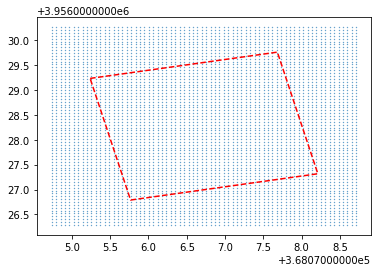

In [11]:
plt.plot(*roi_geo_xy.T, 'r--')
plt.scatter(*xxyy.T, s=0.1)

## 2) get the z values of geo_xy

In [12]:
ctrl_pts_geo_xyz = idp.ROI()
ctrl_pts_geo_xyz.crs = roi.crs
ctrl_pts_geo_xyz[roi_id] = xxyy

roi_geo_xyz = idp.ROI()
roi_geo_xyz.crs = roi.crs
roi_geo_xyz[roi_id] = roi[roi_id]

In [13]:
ctrl_pts_geo_xyz.get_z_from_dsm(ms_dict[current_date].dsm, mode='point')
ctrl_pts_geo_xyz

Read z values of roi from DSM [broccoli_tanashi_5_20220331_0_dsm.tif]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.62s/it]


<easyidp.ROI> with 1 items
[0]	114
array([[ 368074.73878701, 3956026.28851024,      96.45957184],
       [ 368074.79634886, 3956026.28851024,      96.49176788],
       [ 368074.85391072, 3956026.28851024,      96.50333405],
       ...,
       [ 368078.5954312 , 3956030.26027814,      96.68312073],
       [ 368078.65299305, 3956030.26027814,      96.47283173],
       [ 368078.71055491, 3956030.26027814,      96.46427917]])

In [14]:
roi_geo_xyz.get_z_from_dsm(ms_dict[current_date].dsm, mode='face')
roi_geo_xyz

Read z values of roi from DSM [broccoli_tanashi_5_20220331_0_dsm.tif]: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 37.00it/s]


<easyidp.ROI> with 1 items
[0]	114
array([[ 368075.23878701, 3956029.23207309,      96.63498688],
       [ 368077.68234986, 3956029.76027814,      96.63498688],
       [ 368078.21055491, 3956027.31671528,      96.63498688],
       [ 368075.76699205, 3956026.78851024,      96.63498688],
       [ 368075.23878701, 3956029.23207309,      96.63498688]])

In [15]:
def back2raw_one2one(ms, coords, img_name):
    return ms._back2raw_one2one(
        ms._world2local(ms._crs2world(coords)), 
        img_name
    )

## 3) get the pixel coordinates on raw image & dom

In [16]:
ms = ms_dict[current_date]
ctrl_pts_pix_on_img = back2raw_one2one(ms, ctrl_pts_geo_xyz[0], on_img)
ctrl_pts_pix_on_img

array([[3320.20270266, 2020.6498932 ],
       [3324.90863279, 2007.46464973],
       [3328.74584265, 1993.94132445],
       ...,
       [2597.72322858,  857.00135173],
       [2602.31967728,  856.46578107],
       [2605.69757446,  843.23907033]])

In [17]:
ctrl_pts_pix_on_dom = ms.dom.geo2pixel(ctrl_pts_geo_xyz[0])
ctrl_pts_pix_on_dom

array([[ 5083.05765049, 12610.62689208],
       [ 5097.27953949, 12610.62689208],
       [ 5111.5014285 , 12610.62689208],
       ...,
       [ 6035.92421361, 11629.3165511 ],
       [ 6050.14610262, 11629.3165511 ],
       [ 6064.36799162, 11629.3165511 ]])

In [18]:
roi_pix_on_img = back2raw_one2one(ms, roi_geo_xyz[0], on_img)
roi_pix_on_img

array([[2650.00331257, 1731.75402395],
       [2665.40280059, 1110.61662291],
       [3284.56438785, 1128.00412908],
       [3268.26437984, 1747.37881365],
       [2650.00331257, 1731.75402395]])

In [19]:
roi_pix_on_dom = ms.dom.geo2pixel(roi_geo_xyz[0])
roi_pix_on_dom

array([[ 5206.59336126, 11883.35663287],
       [ 5810.32790972, 11752.85226187],
       [ 5940.83228084, 12356.5868102 ],
       [ 5337.09773239, 12487.09118131],
       [ 5206.59336126, 11883.35663287]])

[Figures] Draw figures for thesis

In [20]:
buffer = 200

dom_xmin, dom_ymin = roi_pix_on_dom.min(axis=0)
dom_xmax, dom_ymax = roi_pix_on_dom.max(axis=0)

dom_grid_crop = ms.dom.crop_rectangle(
    left = int(dom_xmin - buffer),
    top  = int(dom_ymin - buffer),
    w    = int(dom_xmax - dom_xmin + buffer * 2),
    h    = int(dom_ymax - dom_ymin + buffer * 2),
    is_geo=False   # this is pixel coordinate on dom
)

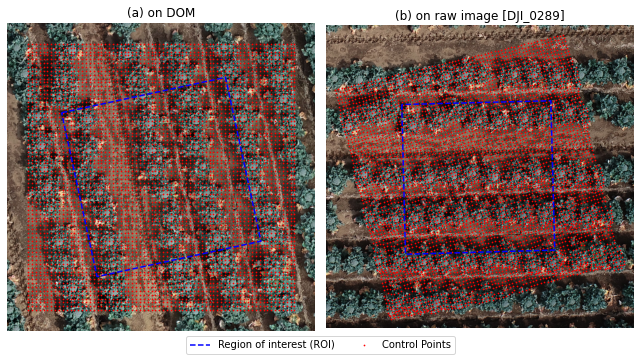

In [21]:
fig, ax = plt.subplots(1,2, figsize=(9,5))

ax[0].imshow(dom_grid_crop[:,:,0:3])
offset_coord = roi_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[0].plot(*offset_coord.T, '--b', label='Region of interest (ROI)')

offset_ctrl_pts = ctrl_pts_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[0].scatter(*offset_ctrl_pts.T, s=0.5, c='r', label='Control Points')

ax[0].axis('off')

ax[0].set_title('(a) on DOM')

img_np = plt.imread(ms.photos[on_img].path)
ax[1].imshow(img_np)

ax[1].scatter(ctrl_pts_pix_on_img[:,0], ctrl_pts_pix_on_img[:,1], s=0.5, c='r')
ax[1].plot(*roi_pix_on_img.T, 'b--')

bf = 40
xn,yn = ctrl_pts_pix_on_img.min(axis=0)
xm,ym = ctrl_pts_pix_on_img.max(axis=0)

ax[1].set_xlim([xn-bf, xm+bf])
ax[1].set_ylim([yn-bf, ym+bf])

ax[1].axis('off')

ax[1].set_title(f'(b) on raw image [{on_img}]')

fig.legend(loc='lower center', ncol=2)

plt.tight_layout()
plt.savefig(f'archive/transform_cp_{current_date}_{roi_id}_{on_img}.pdf', bbox_inches='tight')

## 4) piecewise affine transformation

In [22]:
from skimage.transform import ProjectiveTransform, PiecewiseAffineTransform

In [23]:
pie_aff_tform = PiecewiseAffineTransform()
pie_aff_tform.estimate(ctrl_pts_pix_on_dom, ctrl_pts_pix_on_img)

True

In [24]:
prj_tform = ProjectiveTransform()
prj_tform.estimate(roi_pix_on_dom, roi_pix_on_img)

True

## 5) apply to head results

In [25]:
date = f'20{current_date}_0'
img = f'{roi_id}_{on_img}'

In [26]:
def mk_rm_line(bound_np, rm_bound_id):
    bound_np = bound_np[:-1, :]
    
    return shapely.geometry.LineString(bound_np[rm_bound_id-1:rm_bound_id+2,:])

In [30]:
roi_on_cropped_img = np.asarray(head_segment_json[date][img]['gridCoordOnCroppedImage'])
grid_poly = shapely.geometry.Polygon(roi_on_cropped_img)
rm_line = mk_rm_line(roi_on_cropped_img, 2)

shapely_detect_in = []
shapely_detect_out = []
for i, head in enumerate(head_segment_json[date][img]['out']):
    head_shply = shapely.geometry.Polygon(head)
    if head_shply.intersects(rm_line):
        shapely_detect_out.append(i)
    else:
        if head_shply.intersects(grid_poly):
            shapely_detect_in.append(i)
        else:
            shapely_detect_out.append(i)

In [31]:
shapely_detect_in, shapely_detect_out

([0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], [1])

In [32]:
np.asarray(head_segment_json[date][img]['gridCoordOnCroppedImage'])

array([[183.00331257, 803.75402395],
       [198.40280059, 182.61662291],
       [817.56438785, 200.00412908],
       [801.26437984, 819.37881365],
       [183.00331257, 803.75402395]])

In [33]:
offset = np.asarray(head_segment_json[date][img]['cropLeftTopCorner'])
np.asarray(head_segment_json[date][img]['gridCoordOnCroppedImage']) + offset

array([[2650.00331257, 1731.75402395],
       [2665.40280059, 1110.61662291],
       [3284.56438785, 1128.00412908],
       [3268.26437984, 1747.37881365],
       [2650.00331257, 1731.75402395]])

calculate the transformed head segment results

In [34]:
head_on_dom_list = []
head_on_dom_list_old = []
for in_id in shapely_detect_in:
    head_np = np.asarray(head_segment_json[date][img]['out'][in_id])

    head_on_dom_list.append(pie_aff_tform.inverse(head_np + offset))
    head_on_dom_list_old.append(prj_tform.inverse(head_np + offset))

[Figures] draw compare figures

In [35]:
buffer = 50

dom_xmin, dom_ymin = roi_pix_on_dom.min(axis=0)
dom_xmax, dom_ymax = roi_pix_on_dom.max(axis=0)

dom_grid_crop = ms.dom.crop_rectangle(
    left = int(dom_xmin - buffer),
    top  = int(dom_ymin - buffer),
    w    = int(dom_xmax - dom_xmin + buffer * 2),
    h    = int(dom_ymax - dom_ymin + buffer * 2),
    is_geo=False   # this is pixel coordinate on dom
)

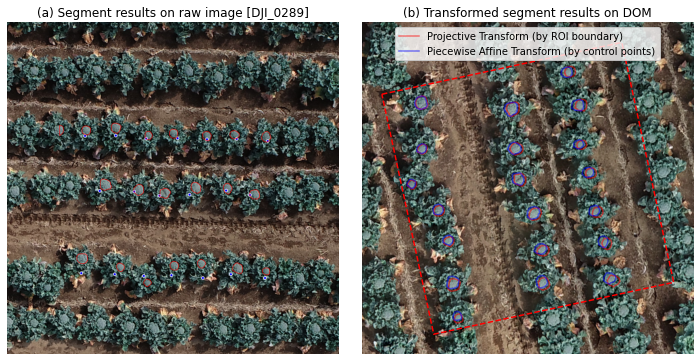

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# show original image figure
img_path  = f"{project_data_folder}/{working_spacename}/results/{date}/{roi_id}_{on_img}.png" 

img = plt.imread(img_path)
ax[0].imshow(img[10:-10, 10:-10])
ax[0].axis('off')


ax[1].imshow(dom_grid_crop[:,:,0:3])
offset_coord = roi_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[1].plot(*offset_coord.T, '--r')


for i, v in enumerate(head_on_dom_list_old):
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    if i == 0:
        ax[1].plot(*bb.T, '-r', alpha=0.5, label='Projective Transform (by ROI boundary)')
    else:
        ax[1].plot(*bb.T, '-r', alpha=0.5)

for i, v in enumerate(head_on_dom_list):
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])

    if i == 0:
        ax[1].plot(*bb.T, '-b', alpha=0.5, label='Piecewise Affine Transform (by control points)')
    else:
        ax[1].plot(*bb.T, '-b', alpha=0.5)

ax[1].axis('off')
ax[1].legend(loc='upper center')

ax[0].set_title(f'(a) Segment results on raw image [{on_img}]')
ax[1].set_title(f'(b) Transformed segment results on DOM')

plt.tight_layout()
plt.savefig(f'archive/trans_compare_{current_date}_{roi_id}_{on_img}.pdf', bbox_inches='tight')
plt.show()

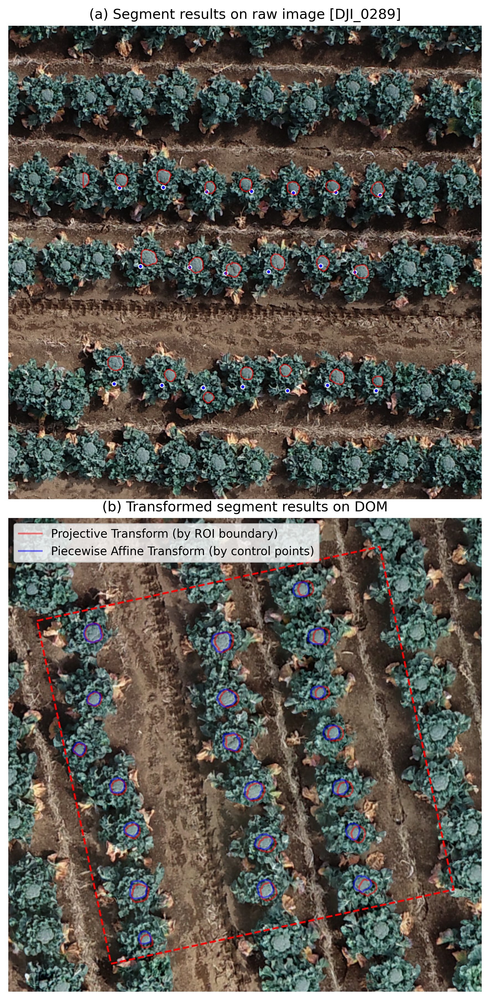

In [36]:
fig, ax = plt.subplots(2, 1, figsize=(6, 12), dpi=300)

# show original image figure
img_path  = f"{project_data_folder}/{working_spacename}/results/{date}/{roi_id}_{on_img}.png" 

img = plt.imread(img_path)
ax[0].imshow(img[10:-10, 10:-10])
ax[0].axis('off')


ax[1].imshow(dom_grid_crop[:,:,0:3])
offset_coord = roi_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[1].plot(*offset_coord.T, '--r')


for i, v in enumerate(head_on_dom_list_old):
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    if i == 0:
        ax[1].plot(*bb.T, '-r', alpha=0.5, label='Projective Transform (by ROI boundary)')
    else:
        ax[1].plot(*bb.T, '-r', alpha=0.5)

for i, v in enumerate(head_on_dom_list):
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])

    if i == 0:
        ax[1].plot(*bb.T, '-b', alpha=0.5, label='Piecewise Affine Transform (by control points)')
    else:
        ax[1].plot(*bb.T, '-b', alpha=0.5)

ax[1].axis('off')
ax[1].legend()
plt.tight_layout()

ax[0].set_title(f'(a) Segment results on raw image [{on_img}]')
ax[1].set_title(f'(b) Transformed segment results on DOM')

plt.savefig(f'archive/trans_compare_{current_date}_{roi_id}_{on_img}.pdf', bbox_inches='tight')
plt.show()

# 3. test the circular fit package

https://github.com/AlliedToasters/circle-fit

In [48]:
import utils.circle_fit as cf

in the following case, the outlier is the half circie, use this as the testing case

```python
roi_id = '114'
current_date = '220331'
on_img = 'DJI_0289'
```

In [49]:
shapely_detect_out

[1]

In [63]:
test_head = head_segment_json[date][f'{roi_id}_{on_img}']['out'][shapely_detect_out[0]]
test_head = np.asarray(test_head)
test_head

array([[161. , 342.5],
       [159.5, 342. ],
       [159.5, 313. ],
       [163. , 312.5],
       [167. , 314.5],
       [170.5, 318. ],
       [171.5, 329. ],
       [170.5, 330. ],
       [170.5, 333. ],
       [167.5, 337. ],
       [161. , 342.5]])

In [58]:
from scipy.spatial import ConvexHull

In [67]:
hull = ConvexHull(test_head)
hull.vertices

array([5, 6, 8, 9, 0, 1, 2, 3, 4], dtype=int32)

In [68]:
test_head[hull.vertices]

array([[170.5, 318. ],
       [171.5, 329. ],
       [170.5, 333. ],
       [167.5, 337. ],
       [161. , 342.5],
       [159.5, 342. ],
       [159.5, 313. ],
       [163. , 312.5],
       [167. , 314.5]])

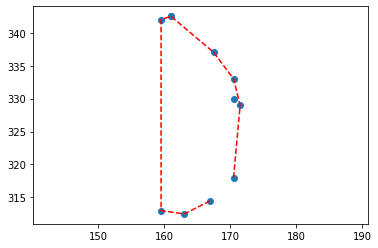

In [71]:
fig, ax = plt.subplots(1,1)

ax.scatter(*test_head.T)

ax.plot(*test_head[hull.vertices].T, 'r--')
ax.axis('equal')
plt.show()

In [75]:
xy, yc, r, sigma = cf.hyperLSQ(test_head[hull.vertices])
xy, yc, r

(156.79857225822212, 326.8558051545118, 15.381769784372572)

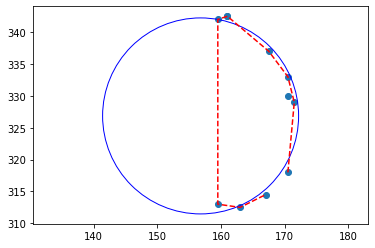

In [76]:
fig, ax = plt.subplots(1,1)

ax.scatter(*test_head.T)

ax.plot(*test_head[hull.vertices].T, 'r--')

circ = plt.Circle((xy, yc), r, color='b', fill=False)
ax.add_patch(circ)

ax.axis('equal')
plt.show()

In [80]:
def find_polygon_circular_center(polygon):
    if not isinstance(polygon, np.ndarray):
        polygon = np.asarray(polygon)
    hull = ConvexHull(polygon)
    hull_pts = polygon[hull.vertices]
    xy, yc, r, sigma = cf.hyperLSQ(hull_pts)

    return xy, yc, r, sigma

# 4. Run all and link broccoli id

In [45]:
from scipy.spatial import KDTree

build a kdtree for broccoli id for quick search

In [83]:
head_np2d

array([[ 368059.70337271, 3956057.88353261],
       [ 368059.93162897, 3956056.75447929],
       [ 368060.07021313, 3956056.04525446],
       ...,
       [ 368101.64654537, 3956066.66905537],
       [ 368102.57079688, 3956049.19636116],
       [ 368123.85824642, 3956022.79668753]])

In [46]:
kdtree = KDTree(head_np2d)
broccoli_idx

array([    1,     4,     6, ...,  8001,  7488, 10385], dtype=uint16)

A loop in one grid

In [85]:
div_thresh = 0.3 # m
total_result = {}

for inx in shapely_detect_in:
    head_np = np.asarray(head_segment_json[date][f'{roi_id}_{on_img}']['out'][inx])
    head_pix_np = pie_aff_tform.inverse(head_np + offset)

    head_geo_np = ms.dom.pixel2geo(head_pix_np)
    xc, yc, r, sigma = find_polygon_circular_center(head_geo_np)

    dist, id_list_idx = kdtree.query(np.array([xc, yc]))
    this_broccoli_id = broccoli_idx[id_list_idx]

    if dist > div_thresh:
        color = "g"
        print(f"Broccoli {this_broccoli_id} detect distence {dist} is over {div_thresh}")
        save_img = True
    else:
        color = "r"
    
    print(dist, this_broccoli_id)

0.08777009899059397 2126
0.06673757302383367 2125
0.06967067595589863 2128
0.05287788013467026 2130
0.04572575384729972 2127
0.037245901720587726 2129
0.051657616456232236 2131
0.1002073788750534 1988
0.11300858122443799 1991
0.029157896131841006 1992
0.06135741861820857 1989
0.07264951770735302 1990
0.059048998801920785 1993
0.1754248452454189 1849
0.169026784556627 1853
0.1179648227996717 1852
0.10982149547147352 1854
0.10807442372504572 1850
0.07728140214028814 1855
0.09425972128126545 1851


## calculate the 2D traits

In [87]:
from PIL import Image, ImageDraw
from skimage.measure import label, regionprops, regionprops_table
import math
import cv2

In [91]:
def draw_binary_image(poly_list):
    poly_merge = np.vstack(poly_list)
    
    xmax, ymax = np.max(poly_merge, axis=0)
    xmin, ymin = np.min(poly_merge, axis=0)
    xlen = xmax - xmin
    ylen = ymax - ymin

    res = 0.001 # 1mm/ pix
    
    w = xlen / res
    h = ylen / res

    im = Image.new(mode='1', size=tuple(np.ceil([w, h]).astype(int)))
    draw = ImageDraw.Draw(im)
    
    points = []
    for p in poly_list:
        point = (p - np.asarray([xmin, ymin])) / res
        draw.polygon(point.reshape(len(point)*2).tolist(), fill='white', outline='white')
        points.append(point)
        
    return np.asarray(im), points

In [88]:
props_all = pd.DataFrame(columns=["date", "label", "area", "convex_area", "eccentricity", 
                                  "equivalent_diameter", "major_axis_length", "minor_axis_length", 
                                  "min_area_rect_max", "min_area_rect_min", "perimeter", 'circularity',
                                  "circular_x", "circular_y", "circular_r", "polygon"])

In [105]:
def get_2D_traits(head_geo_np, date, this_broccoli_id, xc, yc, r):
    binary_img, pix = draw_binary_image([head_geo_np])
    rect = cv2.minAreaRect(pix[0].astype(np.int32))
    label_img = label(binary_img)

    props = pd.DataFrame(regionprops_table(label_img, 
                        properties=["area", "convex_area", "eccentricity", 
                                    "equivalent_diameter", "major_axis_length", "minor_axis_length", 
                                    "perimeter"]))
    props['circularity'] = 4 * props.area * np.pi / props.perimeter ** 2
    props['date'] = date
    props['label'] = this_broccoli_id

    props["circular_x"] = xc
    props["circular_y"] = yc
    props["circular_r"] = r * 1000  # mm

    props["min_area_rect_max"] = max(rect[1][0], rect[1][1])
    props["min_area_rect_min"] = min(rect[1][0], rect[1][1])

    props['polygon'] = str(head_geo_np.tolist())

    props = props[["date", "label", "area", 
                "convex_area", "eccentricity", "equivalent_diameter", "major_axis_length", 
                "minor_axis_length", "min_area_rect_max", "min_area_rect_min", "perimeter", 
                'circularity', "circular_x", "circular_y", "circular_r", "polygon"]]
    return props

In [106]:
get_2D_traits(head_geo_np, date, this_broccoli_id, xc, yc, r)

,date,label,area,convex_area,eccentricity,equivalent_diameter,major_axis_length,minor_axis_length,min_area_rect_max,min_area_rect_min,perimeter,circularity,circular_x,circular_y,circular_r,polygon
0,20220331_0,1851,5818,6045,0.293738,86.068041,88.502003,84.597835,84.683228,81.670784,300.048773,0.812082,368075.539729,3.956028e+06,45.672313,"[[368075.49972761475, 3956028.3035962433], [36..."
